## Preparing Data for YOLOv5 Object Detection

In [ ]:
## Mount the google drive
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!ls "/content/gdrive/My Drive/"

'1015 Grp Proj Prep.gdoc'
'Assignment 1_ThantHtooAung_T129.gdoc'
'Assignment 3 draft.gdoc'
 Assignment_ThantHtooAung.pdf
'Blog 1_ThantHtooAung_T129.gdoc'
'Blog 1_ThantHtooAung_T129.pdf'
 Blog2_ThantHtooAung_U2220809L_T127.gdoc
'CC0003 class notes.gdoc'
'CC0003 Poster.gdoc'
'CC0005 - Healthy Living'
'CC1 Script.gdoc'
'CC5 Research.gdoc'
'Colab Notebooks'
'Copy of Bitcoin Company Pitch Deck by Slidesgo.gslides'
'Copy of CS50 Pixel Art.gsheet'
'Copy of Elegant Romantic Vines Newsletter by Slidesgo.gsheet'
'Copy of IMG_0001_1.JPG'
'Copy of Vacom Pitch Deck by Slidesgo.gslides'
'Copy of Youth Mental Health First Aid Workshop | by Slidesgo.gslides'
'Couple photos '
'Cover Letter.gdoc'
 EG1001
'EG1001 Gp 5 Topic 1.gdoc'
'EG1001 Grp 5.gslides'
'EG1001 Research.gdoc'
'Eg1001 script.gdoc'
'Election Rally Script.gdoc'
'[Garage]Deep-Learning Notes.pptx'
'GP5_Thant Htoo Aung.gdoc'
'Graduation Photos'
'Highest Qualification Certificate .jpg'
'Highest Qualification certificate.pdf'
'Highest Qualifica

In [ ]:
import os
import zipfile
import sys

In [ ]:
## unzip the train_labels file
if not os.path.exists('train'):
    
    # Specify the path to the zip file
    zip_file_path = '/content/gdrive/My Drive/train_labels.zip'
    
    # Specify the path to the target folder to extract the zip file into
    target_folder = '/content/datasets/train/labels'
    
    # Check if the target folder already exists
    if os.path.exists(target_folder):
        print(f"Target folder '{target_folder}' already exists. Skipping extraction.")
    else:
        # Extract the zip file
        with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
            print("Extracting in progress . . .")
            zip_ref.extractall(target_folder)
            print("Zip file extracted successfully.")

Extracting in progress . . .
Zip file extracted successfully.


In [ ]:
# check the current working directory
current_working_directory = os.getcwd()
# print output to the console
print(current_working_directory)

/content


In [ ]:
!ls /content

datasets  gdrive  sample_data


In [ ]:
# unzip the val_labels file
if not os.path.exists('val'):
    
    # Specify the path to the zip file
    zip_file_path = '/content/gdrive/My Drive/val_labels.zip'
    
    # Specify the path to the target folder to extract the zip file into
    target_folder = '/content/datasets/val/labels'
    
    # Check if the target folder already exists
    if os.path.exists(target_folder):
        print(f"Target folder '{target_folder}' already exists. Skipping extraction.")
    else:
        # Extract the zip file
        with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
            print("Extracting in progress . . .")
            zip_ref.extractall(target_folder)
            print("Zip file extracted successfully.")

Extracting in progress . . .
Zip file extracted successfully.


In [ ]:
# unzip the train images file
if not os.path.exists('train/images'):
    
    # Specify the path to the zip file
    zip_file_path = '/content/gdrive/My Drive/Train.zip'
    
    # Specify the path to the target folder to extract the zip file into
    target_folder = '/content/datasets/train/images'
    
    # Check if the target folder already exists
    if os.path.exists(target_folder):
        print(f"Target folder '{target_folder}' already exists. Skipping extraction.")
    else:
        # Extract the zip file
        with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
            print("Extracting in progress . . .")
            zip_ref.extractall(target_folder)
            print("Zip file extracted successfully.")

Extracting in progress . . .
Zip file extracted successfully.


In [ ]:
if not os.path.exists('val/images'):
    
    # Specify the path to the zip file
    zip_file_path = '/content/gdrive/My Drive/Validation.zip'
    
    # Specify the path to the target folder to extract the zip file into
    target_folder = '/content/datasets/val/images'
    
    # Check if the target folder already exists
    if os.path.exists(target_folder):
        print(f"Target folder '{target_folder}' already exists. Skipping extraction.")
    else:
        # Extract the zip file
        with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
            print("Extracting in progress . . .")
            zip_ref.extractall(target_folder)
            print("Zip file extracted successfully.")

Extracting in progress . . .
Zip file extracted successfully.


In [ ]:
print("No. of Training images", len(os.listdir('datasets/train/images')))
print("No. of Training labels", len(os.listdir('datasets/train/labels')))

print("No. of valid images", len(os.listdir('datasets/val/images')))
print("No. of valid labels", len(os.listdir('datasets/val/labels')))

No. of Training images 5664
No. of Training labels 5664
No. of valid images 800
No. of valid labels 800


## Training Phase

In [ ]:
import os
import glob as glob
import matplotlib.pyplot as plt
import cv2
import requests
import random
import numpy as np
import yaml

np.random.seed(42)

### Helper function for logging

In [ ]:
TRAIN = True
# Number of epochs to train for.
EPOCHS = 50

In [ ]:
def set_res_dir():
    # Directory to store results
    res_dir_count = len(glob.glob('runs/train/*'))
    print(f"Current number of result directories: {res_dir_count}")
    if TRAIN:
        RES_DIR = f"results_{res_dir_count+1}"
        print(RES_DIR)
    else:
        RES_DIR = f"results_{res_dir_count}"
    return RES_DIR

In [ ]:
def monitor_tensorboard():
    %load_ext tensorboard
    %tensorboard --logdir runs/train

In [ ]:
## clone yolov5 repo
if not os.path.exists('yolov5'):
    !git clone https://github.com/ultralytics/yolov5.git

Cloning into 'yolov5'...
remote: Enumerating objects: 15705, done.
remote: Counting objects: 100% (33/33), done.
remote: Compressing objects: 100% (30/30), done.
remote: Total 15705 (delta 9), reused 15 (delta 3), pack-reused 15672
Receiving objects: 100% (15705/15705), 14.51 MiB | 17.35 MiB/s, done.
Resolving deltas: 100% (10750/10750), done.


In [ ]:
%cd yolov5/
!pwd

/content/yolov5
/content/yolov5


In [ ]:
!pip install -r requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 12.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 592.7/592.7 kB 50.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.5 MB/s eta 0:00:00


In [ ]:
dataw = {
    'path': '/content/datasets/',
    'train': 'train/images',
    'val': 'val/images',
    'nc': '200',
    'names': ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49', '50', '51', '52', '53', '54', '55', '56', '57', '58', '59', '60', '61', '62', '63', '64', '65', '66', '67', '68', '69', '70', '71', '72', '73', '74', '75', '76', '77', '78', '79', '80', '81', '82', '83', '84', '85', '86', '87', '88', '89', '90', '91', '92', '93', '94', '95', '96', '97', '98', '99', '100', '101', '102', '103', '104', '105', '106', '107', '108', '109', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '120', '121', '122', '123', '124', '125', '126', '127', '128', '129', '130', '131', '132', '133', '134', '135', '136', '137', '138', '139', '140', '141', '142', '143', '144', '145', '146', '147', '148', '149', '150', '151', '152', '153', '154', '155', '156', '157', '158', '159', '160', '161', '162', '163', '164', '165', '166', '167', '168', '169', '170', '171', '172', '173', '174', '175', '176', '177', '178', '179', '180', '181', '182', '183', '184', '185', '186', '187', '188', '189', '190', '191', '192', '193', '194', '195', '196', '197', '198', '199']

}

# Specify the file path for the YAML file
file_path = '/content/plushie200.yaml'

# Write the data to the YAML file
with open(file_path, 'w') as file:
    print("Creating YAML file . . .")
    yaml.dump(dataw, file)
    print("YAML file is created")

Creating YAML file . . .
YAML file is created


In [ ]:
import torch
torch.cuda.empty_cache()

In [ ]:
RES_DIR = set_res_dir()
if TRAIN:
  !python train.py --data /content/plushie200.yaml --epochs {EPOCHS} --weights 'yolov5s.pt' --batch-size 64 --name {RES_DIR} --cache ram

Current number of result directories: 0
results_1
train: weights=yolov5s.pt, cfg=, data=/content/plushie200.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=64, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=results_1, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=

In [ ]:
!ls

benchmarks.py	 detect.py   __pycache__       segment	       val.py
CITATION.cff	 export.py   README.md	       setup.cfg       yolov5s.pt
classify	 hubconf.py  README.zh-CN.md   train.py
CONTRIBUTING.md  LICENSE     requirements.txt  tutorial.ipynb
data		 models      runs	       utils


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!cd runs

In [ ]:
!ls

benchmarks.py	 detect.py   __pycache__       segment	       val.py
CITATION.cff	 export.py   README.md	       setup.cfg       yolov5s.pt
classify	 hubconf.py  README.zh-CN.md   train.py
CONTRIBUTING.md  LICENSE     requirements.txt  tutorial.ipynb
data		 models      runs	       utils


In [ ]:
cd runs/train

/content/yolov5/runs/train


In [ ]:
!ls

results_1


In [ ]:
# check the current working directory
current_working_directory = os.getcwd()
# print output to the console
print(current_working_directory)

/content/yolov5/runs/train


In [ ]:
monitor_tensorboard()

<IPython.core.display.Javascript object>

## Visualization and Inference

In [ ]:
# Function to show validation predictions saved during training.
def show_valid_results(RES_DIR):
    !ls runs/train/{RES_DIR}
    EXP_PATH = f"runs/train/{RES_DIR}"
    validation_pred_images = glob.glob(f"{EXP_PATH}/*_pred.jpg")
    print(validation_pred_images)
    for pred_image in validation_pred_images:
        image = cv2.imread(pred_image)
        plt.figure(figsize=(19, 16))
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
        plt.show()

In [ ]:
# Helper function for inference on images.
def inference(RES_DIR, data_path):
    # Directory to store inference results.
    infer_dir_count = len(glob.glob('yolov5/runs/detect/*'))
    print(f"Current number of inference detection directories: {infer_dir_count}")
    INFER_DIR = f"inference_{infer_dir_count+1}"
    print(INFER_DIR)
    # Inference on images.
    !python detect.py --weights runs/train/{RES_DIR}/weights/best.pt \
    --source {data_path} --name {INFER_DIR}
    return INFER_DIR

In [ ]:
def visualize(INFER_DIR):
# Visualize inference images.
    INFER_PATH = f"runs/detect/{INFER_DIR}"
    infer_images = glob.glob(f"{INFER_PATH}/*.jpg")
    print(infer_images)
    for pred_image in infer_images:
        image = cv2.imread(pred_image)
        plt.figure(figsize=(19, 16))
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
        plt.show()

confusion_matrix.png				    results.png
events.out.tfevents.1685325719.c27692cfda0c.4848.0  train_batch0.jpg
F1_curve.png					    train_batch1.jpg
hyp.yaml					    train_batch2.jpg
labels_correlogram.jpg				    val_batch0_labels.jpg
labels.jpg					    val_batch0_pred.jpg
opt.yaml					    val_batch1_labels.jpg
P_curve.png					    val_batch1_pred.jpg
PR_curve.png					    val_batch2_labels.jpg
R_curve.png					    val_batch2_pred.jpg
results.csv					    weights
['runs/train/results_1/val_batch2_pred.jpg', 'runs/train/results_1/val_batch1_pred.jpg', 'runs/train/results_1/val_batch0_pred.jpg']


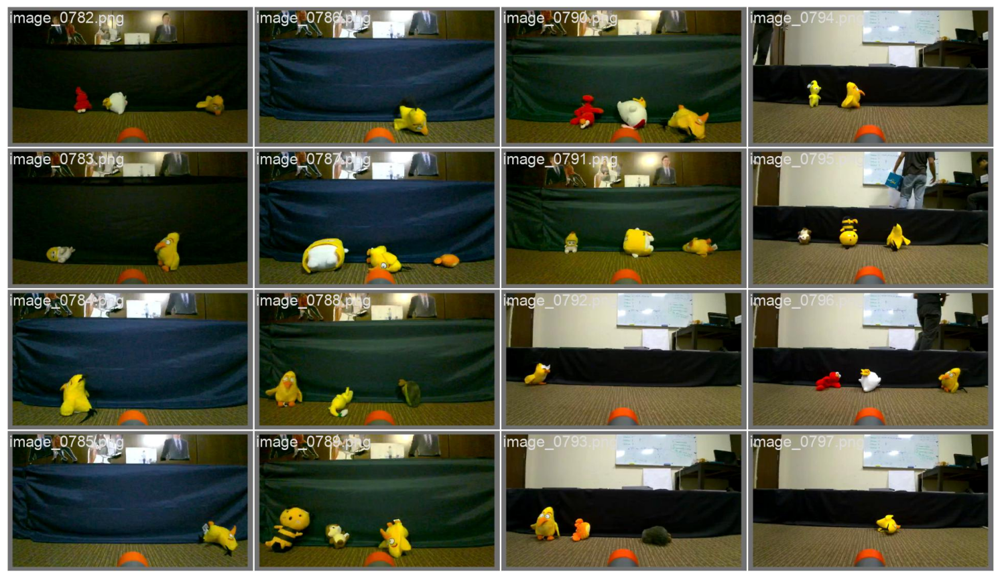

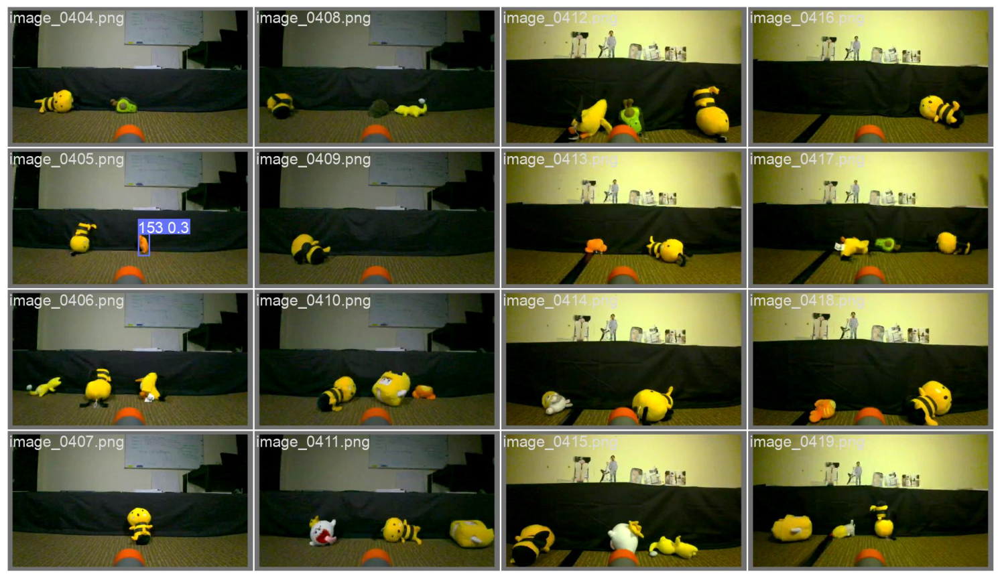

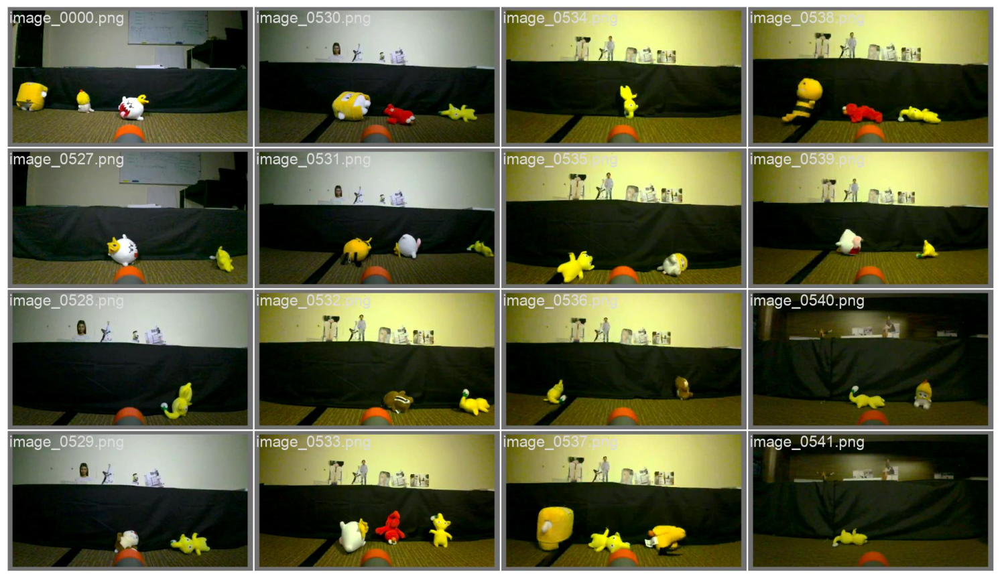

In [ ]:
show_valid_results(RES_DIR)

In [ ]:
# check the current working directory
current_working_directory = os.getcwd()
# print output to the console
print(current_working_directory)

/content


In [ ]:
cd /content

/content


In [ ]:
cd /content/yolov5

/content/yolov5
